# **Auto-Tyre-Vision** 📝

## **Import relevant libraries**

In [ ]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import cv2 as cv
import random
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
os.environ["WANDB_DISABLED"] = "true"


In [ ]:
# prompt: https://github.com/Praveen1034/Auto-Tyre-Vision
# this is link you have to take all data from this

!git clone https://github.com/Praveen1034/Auto-Tyre-Vision.git
%cd Auto-Tyre-Vision

Cloning into 'Auto-Tyre-Vision'...
remote: Enumerating objects: 1016, done.
remote: Counting objects: 100% (1016/1016), done.
remote: Compressing objects: 100% (1009/1009), done.
remote: Total 1016 (delta 4), reused 1013 (delta 4), pack-reused 0 (from 0)
Receiving objects: 100% (1016/1016), 14.92 MiB | 16.37 MiB/s, done.
Resolving deltas: 100% (4/4), done.
/content/Auto-Tyre-Vision


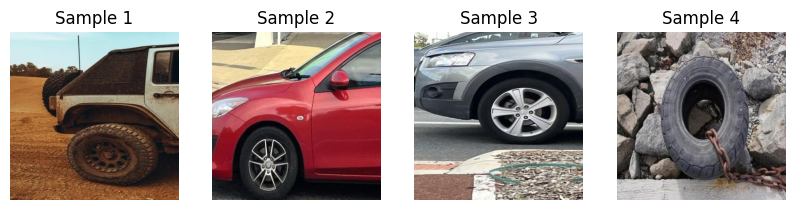

In [ ]:
# lets look at some images

image_dir = '/content/Auto-Tyre-Vision/train/images'

image_list = [f for f in os.listdir(image_dir) if f.endswith(('.jpg','.jpeg','png'))]

# Randomly select 4 images
random_images =random.sample(image_list,4)

#create subplots
fig,ax = plt.subplots(1,4,figsize=(10,5))

#Loop through selected images and plot them
for i,image_file in enumerate(random_images):
    image_path=os.path.join(image_dir,image_file)
    image=cv.imread(image_path)
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    ax[i].imshow(image_rgb)
    ax[i].set_title(f'Sample {i+1}')
    ax[i].axis('off')

plt.show()

# Download YOLOv5 Model 🧬

In [ ]:
%cd /kaggle/working/
!git clone https://github.com/ultralytics/yolov5
%cd yolov5

#Install dependcies
%pip install -r requirements.txt
%cd ../

import torch
print(f"Setup complete. Using Torch Version {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")


[Errno 2] No such file or directory: '/kaggle/working/'
/content/Auto-Tyre-Vision
Cloning into 'yolov5'...
remote: Enumerating objects: 17483, done.
remote: Total 17483 (delta 0), reused 0 (delta 0), pack-reused 17483 (from 1)
Receiving objects: 100% (17483/17483), 16.53 MiB | 16.84 MiB/s, done.
Resolving deltas: 100% (11988/11988), done.
/content/Auto-Tyre-Vision/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 38.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s 

# Creating YAML file 📜

YAML file is used to point where our training and validation data is, the number of classes that we want to detect and the names corresponding to those classes

In [ ]:
import yaml

data_yaml = dict(
    train = '/content/Auto-Tyre-Vision/train',
    val = '/content/Auto-Tyre-Vision/valid',
    nc = 1,
    names = ['Tire']
)

%cd /content/Auto-Tyre-Vision/yolov5/data
with open('data.yaml', 'w') as outfile:
    yaml.dump(data_yaml, outfile, default_flow_style=True)
print("Yaml File data.yaml created and saved in the above location")

/content/Auto-Tyre-Vision/yolov5/data
Yaml File data.yaml created and saved in the above location


# Training the model ⚛

In [ ]:
%cd /content/Auto-Tyre-Vision/yolov5
# Note: Takes around 3.5 t0 4 minutes to complete the training
!python train.py --img 416 --batch 16 --epochs 200 --data /content/Auto-Tyre-Vision/yolov5/data/data.yaml --weights yolov5n.pt --exist-ok --name train_results


Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
     98/199      1.07G    0.01367   0.005627          0         33        416:  18% 4/22 [00:00<00:04,  3.69it/s]/content/Auto-Tyre-Vision/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     98/199      1.07G    0.01364   0.005369          0         29        416:  23% 5/22 [00:01<00:04,  3.79it/s]/content/Auto-Tyre-Vision/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     98/199      1.07G    0.01386   0.005665          0         31        416:  27% 6/22 [00:01<00:04,  3.83it/s]/content/Auto-Tyre-Vision/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Model Output for Validation Images  💡


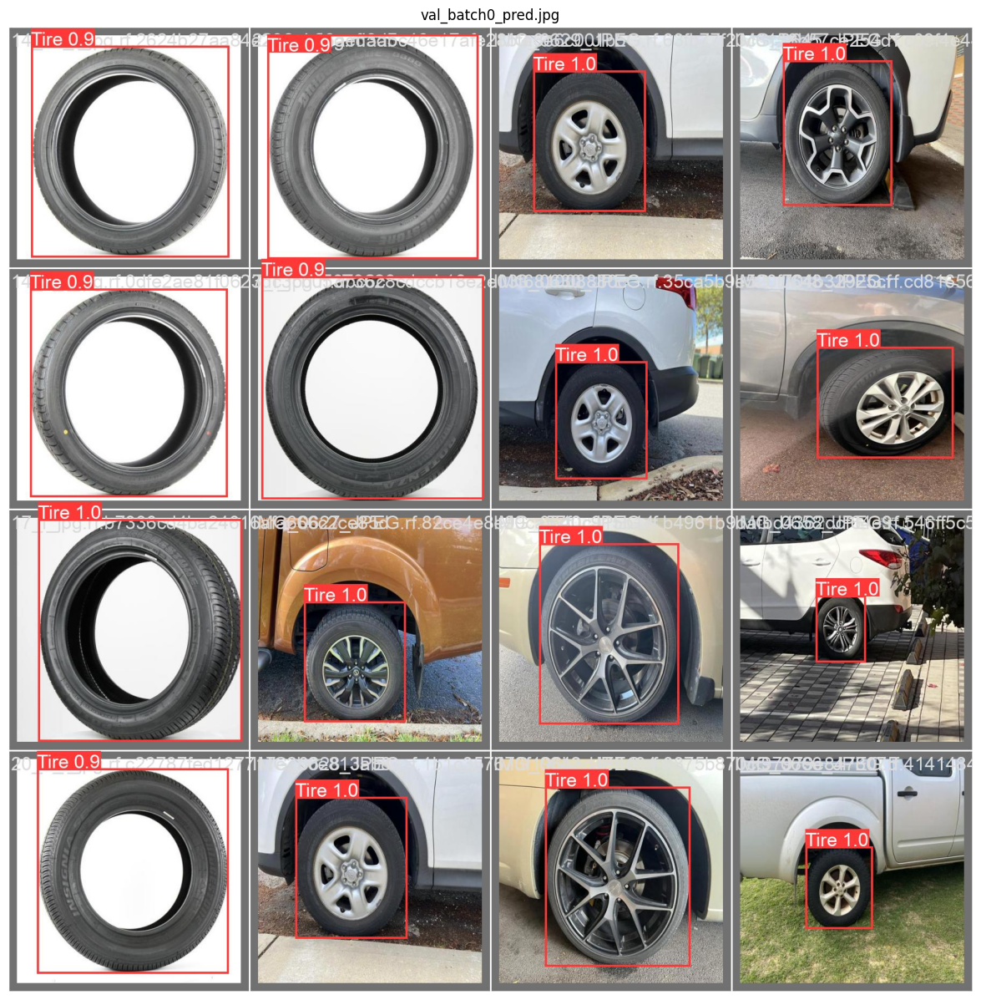

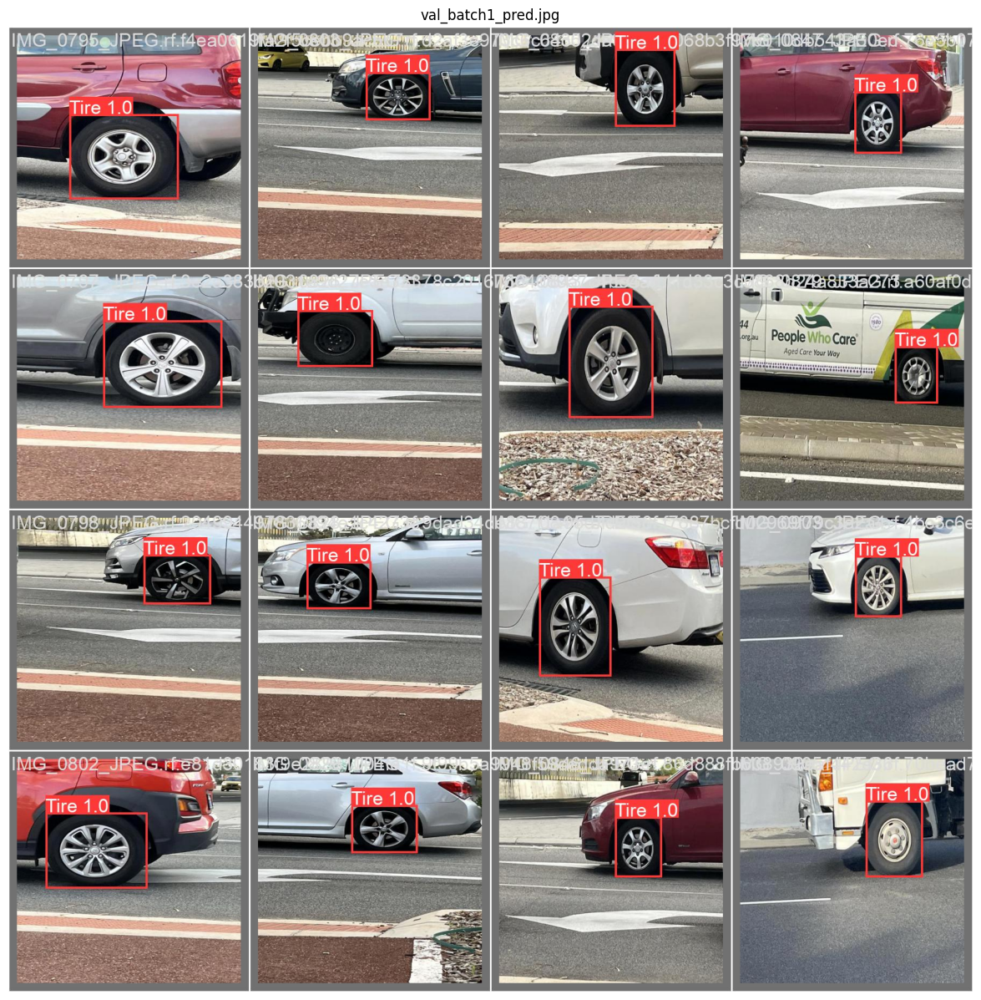

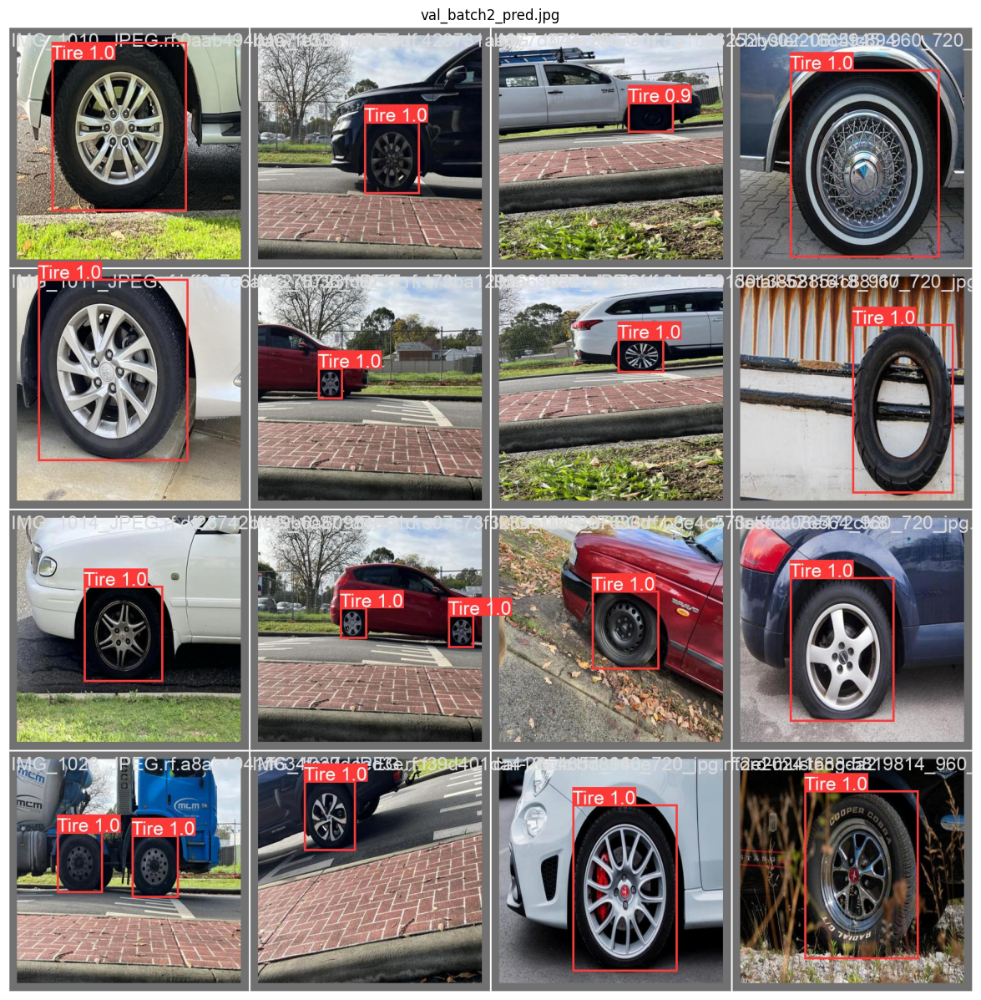

In [ ]:
for i in range(3):
    img = cv.imread(f"/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/val_batch{i}_pred.jpg")

    image_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    plt.figure(figsize=(15,15))
    plt.imshow(image_rgb)
    plt.axis('off')  # Hide axis
    plt.title(f'val_batch{i}_pred.jpg')

# Testing the Model 🎯

In [ ]:
#Randomly pick 5 images from the test directory and run detections
image_dir = '/content/Auto-Tyre-Vision/test/images/'
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg','.jpeg','.png'))]
selected_images = random.sample(image_files,5)

for image in selected_images:
    image_path = os.path.join(image_dir,image)
    !python detect.py --source '{image_path}' --weights /content/Auto-Tyre-Vision/yolov5/runs/train/train_results/weights/best.pt --exist-ok --name '/content/Auto-Tyre-Vision/test'

detect: weights=['/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/weights/best.pt'], source=/content/Auto-Tyre-Vision/test/images/IMG_0791_JPEG.rf.b75f05c92ef0b293d05c2a22c1f1b225.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=/content/Auto-Tyre-Vision/test, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-420-gb34b0416 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 1760518 parameters, 0 gradients, 4.1 GFLOPs
image 1/1 /content/Auto-Tyre-Vision/test/images/IMG_0791_JPEG.rf.b75f05c92ef0b293d05c2a22c1f1b225.jpg: 640x640 1 Tire, 6.1ms
Speed: 0.6ms pre-process, 6.1ms inference, 139.3m

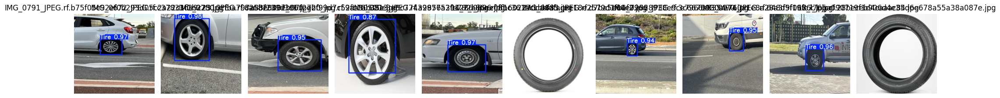

In [ ]:
# Directory containing test results
test_image_dir = '/content/Auto-Tyre-Vision/test'

# Get all image files
image_files = [f for f in os.listdir(test_image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Set up the plot
plt.figure(figsize=(20, 20))

# Display each image
for i, image_file in enumerate(image_files):
    img = cv.cvtColor(cv.imread(os.path.join(test_image_dir, image_file)), cv.COLOR_BGR2RGB)
    plt.subplot(1, len(image_files), i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(image_file)

plt.tight_layout()
plt.show()


# **Testing On Video**

In [ ]:
video_path = '/content/Auto-Tyre-Vision/videoplayback.mp4'

!python /content/Auto-Tyre-Vision/yolov5/detect.py \
        --source '{video_path}' \
        --weights /content/Auto-Tyre-Vision/yolov5/runs/train/train_results/weights/best.pt \
        --exist-ok \
        --name 'test_video_detection'


detect: weights=['/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/weights/best.pt'], source=/content/Auto-Tyre-Vision/videoplayback.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=test_video_detection, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-420-gb34b0416 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 1760518 parameters, 0 gradients, 4.1 GFLOPs
video 1/1 (1/3000) /content/Auto-Tyre-Vision/videoplayback.mp4: 384x640 (no detections), 32.8ms
video 1/1 (2/3000) /content/Auto-Tyre-Vision/videoplayback.mp4: 384x640 (no detections), 7.2ms
video 1/1 (3/3000) /content/Auto-Tyre-Vis

# Examining the Configuration & Results 🔎

In [ ]:
#HYPER PARAMETERS USED DURING TRAINING PHASE

# Load the contents of the hyp.yaml file
hyp_file_path = '/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/hyp.yaml'

with open(hyp_file_path, 'r') as file:
    hyp_contents = yaml.safe_load(file)

# Create a dictionary mapping of parameters to their explanations
explanations = {
    'lr0': "Initial learning rate for the optimizer. A higher value can speed up learning, but may lead to instability.",
    'lrf': "Learning rate final value (at the end of training). Helps in reducing the learning rate as training progresses.",
    'momentum': "Momentum factor used in the optimizer to help accelerate gradients and dampen oscillations.",
    'weight_decay': "Regularization parameter that adds a penalty for large weights, helping to prevent overfitting.",
    'warmup_epochs': "Number of epochs for the warmup phase, where the learning rate is gradually increased.",
    'warmup_momentum': "Initial momentum during the warmup phase.",
    'warmup_bias_lr': "Initial learning rate for bias parameters during warmup.",
    'box': "Weight for the box loss, controlling the influence of bounding box regression.",
    'cls': "Weight for the classification loss, adjusting the importance of correctly classifying objects.",
    'cls_pw': "Positive class weight for the classification loss, helping to handle class imbalance.",
    'obj': "Weight for the objectness loss, helping the model determine if an object exists in a predicted box.",
    'obj_pw': "Positive class weight for the objectness loss.",
    'iou_t': "IoU threshold for defining a positive detection.",
    'anchor_t': "Threshold for defining anchor boxes.",
    'fl_gamma': "Focal loss gamma parameter to adjust focus on hard-to-classify examples.",
    'hsv_h': "Parameter for hue adjustment in HSV color space augmentation.",
    'hsv_s': "Parameter for saturation adjustment in HSV color space augmentation.",
    'hsv_v': "Parameter for value adjustment in HSV color space augmentation.",
    'degrees': "Maximum rotation angle for image augmentation.",
    'translate': "Maximum translation of the image during augmentation.",
    'scale': "Scaling factor for resizing images during augmentation.",
    'shear': "Maximum shear angle for augmentation.",
    'perspective': "Degree of perspective transformation applied to images.",
    'flipud': "Probability of flipping images upside down.",
    'fliplr': "Probability of flipping images left to right.",
    'mosaic': "Indicates whether to use mosaic augmentation during training.",
    'mixup': "Indicates whether to use mixup augmentation during training.",
    'copy_paste': "Indicates whether to use copy-paste augmentation."
}

# Print each parameter with its explanation
for param, value in hyp_contents.items():
    explanation = explanations.get(param, "No explanation available.")
    print(f"{param}: {value} - {explanation}")


lr0: 0.01 - Initial learning rate for the optimizer. A higher value can speed up learning, but may lead to instability.
lrf: 0.01 - Learning rate final value (at the end of training). Helps in reducing the learning rate as training progresses.
momentum: 0.937 - Momentum factor used in the optimizer to help accelerate gradients and dampen oscillations.
weight_decay: 0.0005 - Regularization parameter that adds a penalty for large weights, helping to prevent overfitting.
warmup_epochs: 3.0 - Number of epochs for the warmup phase, where the learning rate is gradually increased.
warmup_momentum: 0.8 - Initial momentum during the warmup phase.
warmup_bias_lr: 0.1 - Initial learning rate for bias parameters during warmup.
box: 0.05 - Weight for the box loss, controlling the influence of bounding box regression.
cls: 0.5 - Weight for the classification loss, adjusting the importance of correctly classifying objects.
cls_pw: 1.0 - Positive class weight for the classification loss, helping to ha

(np.float64(-0.5), np.float64(2249.5), np.float64(1499.5), np.float64(-0.5))

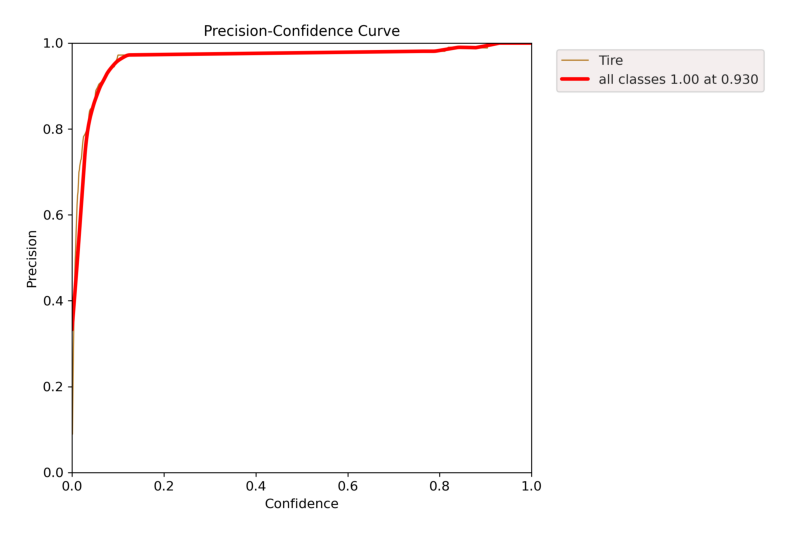

In [ ]:
#Plotting Precision Confidence Curve (P Curve)

p_curve = cv.imread('/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/P_curve.png')
plt.figure(figsize=(10, 10))
plt.imshow(p_curve)
plt.axis('off')


**Interpretting the graph:**

The graph above shows a Precision-Confidence Curve where the Y-axis represents Precision and the X-axis represents Confidence.

Below are are some key inferences based on the curve:

**High Precision:** The curve shows a high precision (close to 1.0) across all confidence levels, which indicates that the model is making accurate predictions when it assigns a high confidence score to its detections.

**Steep Initial Rise:** The initial sharp rise in the curve indicates that, at lower confidence thresholds (closer to 0), precision starts off low but improves significantly as the confidence threshold increases.

**Plateau at High Confidence:** The curve flattens out after a confidence level of around 0.4, indicating that for confidence thresholds higher than this, the model consistently maintains a high level of precision.

**The label** on the right says:
"Tire" is the class for which the curve is plotted.
"all classes 1.00 at 0.947" indicates that for this particular class (Tire), the model achieves perfect precision (1.00) at a confidence threshold of 0.947.
This means that when the model is very confident (confidence ≥ 0.947), it is 100% precise in detecting the "Tire" class.

**Overall Performance:** The overall performance of the model is excellent, especially in terms of precision, which indicates the model is less likely to produce false positives when it assigns a high confidence score to detections.

(np.float64(-0.5), np.float64(2249.5), np.float64(1499.5), np.float64(-0.5))

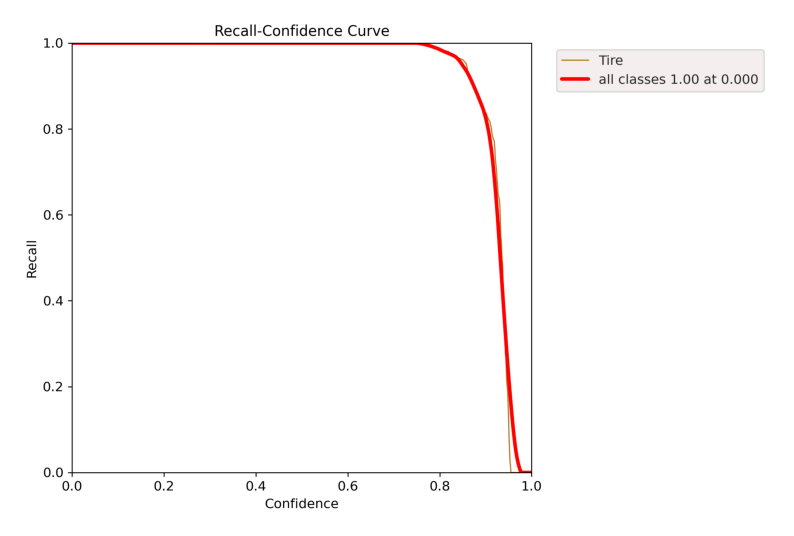

In [ ]:
#Plotting Recall Confidence Curve (R Curve)

r_curve = cv.imread('/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/R_curve.png')
plt.figure(figsize=(10, 10))
plt.imshow(r_curve)
plt.axis('off')

**Interpretting the graph:**

This graph represents the Recall-Confidence Curve focusing on the performance for the class "Tire."

**High Recall at Low Confidence:**
The model achieves high recall values (close to 1.0) when the confidence threshold is low (near 0). This means that at low confidence levels, the model is able to detect most of the true positives (correct detections) for the "Tire" class.

**Sharp Decline with Increasing Confidence:**
As the confidence threshold increases beyond approximately 0.7, the recall begins to drop sharply. This suggests that as the model becomes more confident in its detections, it starts missing some true positives, hence the recall decreases.
At confidence thresholds close to 1.0, recall falls very close to 0, indicating that the model is becoming too selective, detecting very few objects as "Tire" at those high confidence levels.

**Recall-Confidence Tradeoff:**
The curve indicates a typical tradeoff between recall and confidence: setting a higher confidence threshold reduces the number of false positives but increases the likelihood of missing some true positives, leading to a lower recall.

**Class Label Details:**
The legend shows the "Tire" class, and the label indicates "all classes 1.00 at 0.000," meaning that the model achieves 100% recall at a confidence threshold of 0, but this comes at the cost of including many incorrect predictions.

**Overall Analysis**
The model detects almost all true positives (high recall) when the confidence is low, but when the confidence threshold is increased, it becomes more conservative, missing some detections.

(np.float64(-0.5), np.float64(2249.5), np.float64(1499.5), np.float64(-0.5))

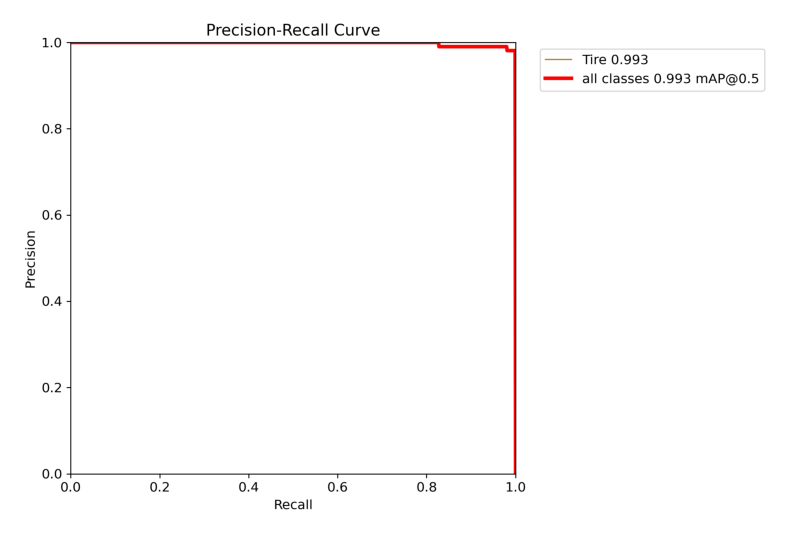

In [ ]:
#Plotting Precision Recall Curve (PR Curve)

pr_curve = cv.imread('/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/PR_curve.png')
plt.figure(figsize=(10, 10))
plt.imshow(pr_curve)
plt.axis('off')

**Interpretting the graph:**

*Note:Precision is a measure of when ""your model predicts how often does it predicts correctly?" It indicates how much we can rely on the model's positive predictions.
Recall is a measure of ""has your model predicted every time that it should have predicted?"" It indicates any predictions that it should not have missed if the model is missing.
Recall and precision are frequently trade-offs & Recall may suffer as precision rises, and vice versa*.

**Y-axis (Precision):**
The precision starts at 1 when recall is 0, meaning that when the model makes its first predictions, all are correct. As recall increases (moving along the x-axis), precision slightly dips down, stabilizing around 0.9 for higher recall values. This suggests that while the model retrieves more positive instances, it starts to include more false positives, reducing precision.

**Legend: "Tire 0.993" and "all classes 0.993 mAP @ 0.5" indicates the model's performance metrics**

0.993 mAP (mean Average Precision): This is a commonly used metric in evaluating object detection tasks. It summarizes the precision-recall curve into a single value, indicating that the model has a very high overall performance.
@ 0.5: This typically refers to the IoU (Intersection over Union) threshold used to define true positives in object detection. An IoU threshold of 0.5 is quite common.


**Inference:**
High Performance: The high mAP of 0.993 suggests that the model is performing exceptionally well achieving a good balance between precision and recall.

Precision Stability: The initial precision of 1 and gradual drop to around 0.9 indicates that the model is very accurate at first but starts introducing some noise as it retrieves more instances. However, maintaining precision around 0.9 is still very good, suggesting the model has a well-optimized detection threshold.





(np.float64(-0.5), np.float64(2249.5), np.float64(1499.5), np.float64(-0.5))

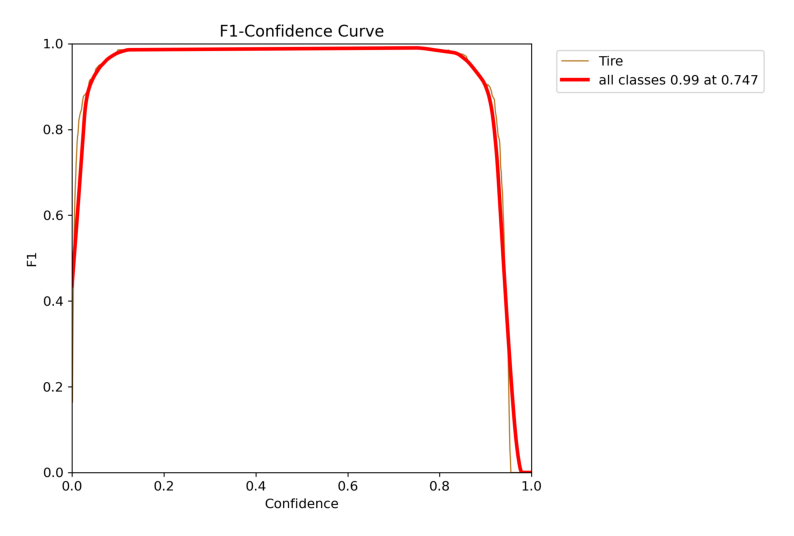

In [ ]:
#Plotting F1 Curve

f1_curve = cv.imread('/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/F1_curve.png')
plt.figure(figsize=(10, 10))
plt.imshow(f1_curve)
plt.axis('off')

**Interpretting the F1 Confidence Curve:**

- **X-Axis (Confidence Threshold):** This represents the confidence threshold used for classifying predictions. A lower threshold means more predictions are classified as positive, while a higher threshold means only the most confident predictions are classified as positive.
- **Y-Axis (F1 Score):** This indicates the F1 score, which balances precision and recall. A higher score means a better balance between these two metrics.

**Key Points**
1. **From (0, 0.6):** Starting at a confidence threshold of 0, the F1 score is relatively low (0.6). This suggests that at this threshold, the model is classifying many instances as positive, but this leads to poor precision and/or recall.

2. **From 0.2 to 0.95:** F1 score peaks at a confidence threshold between 0.2 and 0.95, achieving a maximum value of 1. This suggests that the model is performing optimally in this range, effectively balancing precision and recall.

4. **Dipping down to almost 0 after 0.95:** After reaching the peak, as the confidence threshold approaches 1, the F1 score drops significantly. This could indicate that the model becomes overly selective—only classifying instances as positive when it is extremely confident, which may lead to many false negatives (i.e., missing actual positives).

**Legend (All Classes 0.99 at 0.744)**
- This notation indicates that for all classes combined the model achieves an overall precision and recall of 0.99.


(np.float64(-0.5), np.float64(2999.5), np.float64(2249.5), np.float64(-0.5))

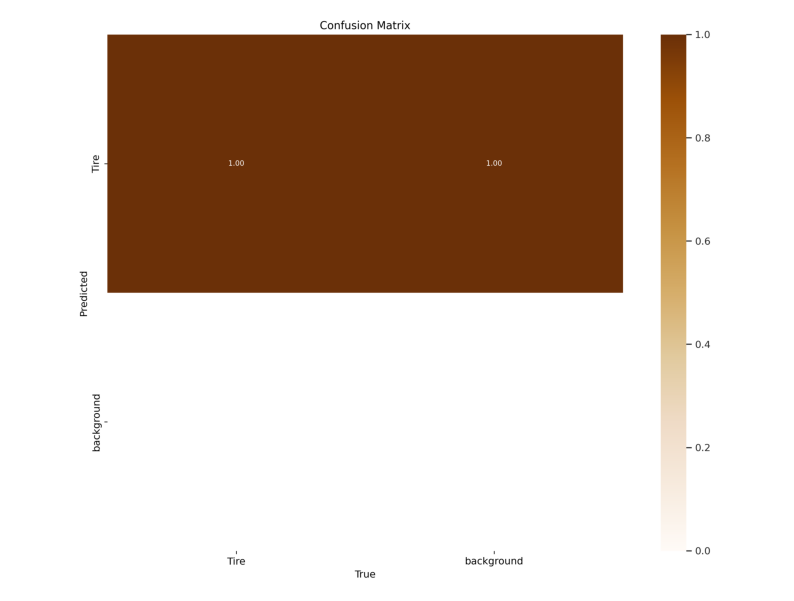

In [ ]:
#Plotting Confusion Matrix

c_matrix = cv.imread('/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/confusion_matrix.png')
plt.figure(figsize=(10, 10))
plt.imshow(c_matrix)
plt.axis('off')

**Interpretting the Confusion Matrix:**

**Perfect Classification:**
Both entries in the matrix have a value of 1.00, which implies perfect classification.
The diagonal values (Tire-Tire and Background-Background) represent true positives and true negatives, indicating that the model has correctly classified 100% of the "Tire" class and 100% of the background as well.

**No Misclassification:**
Off-diagonal values, which would represent false positives (classifying background as "Tire") or false negatives (classifying "Tire" as background), are absent, showing no errors in classification.

**Model Performance:**
This confusion matrix implies that the model has performed perfectly for this particular test, meaning it was able to detect all "Tire" objects correctly and did not misclassify any background as a "Tire" or vice versa.

(np.float64(-0.5), np.float64(2399.5), np.float64(1199.5), np.float64(-0.5))

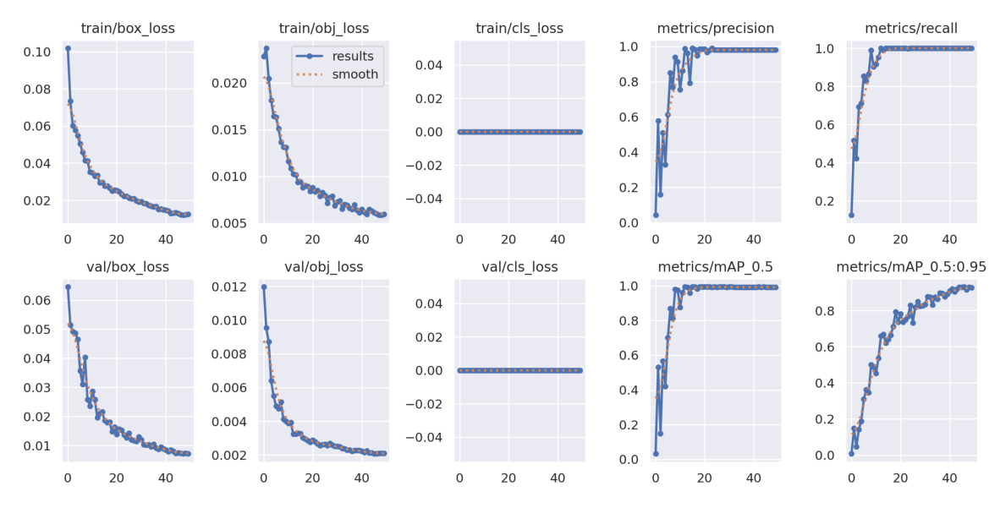

In [ ]:
#Plotting Results

results = cv.imread('/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/results.png')
plt.figure(figsize=(15, 15))
results_rgb = cv.cvtColor(results, cv.COLOR_BGR2RGB)
plt.imshow(results_rgb)
plt.axis('off')

**Interpretting the results**

The `results.png` output from the model provides a visual summary of the training process, helping you evaluate model performance over time.

### 1. **Train/Box Loss**
   - This graph shows the loss associated with the bounding box predictions during training.
   - Lower values indicate better model performance. A decreasing trend suggests that the model is improving in predicting bounding boxes accurately.

### 2. **Train/Obj Loss**
   - This graph represents the objectness loss, which measures how well the model predicts whether an object exists in a given anchor box.
   - Similar to box loss, lower values indicate better performance. A consistent decline is desirable.

### 3. **Train/Cls Loss**
   - This graph shows the classification loss, which measures how well the model classifies the objects within the detected bounding boxes.
   - Lower values indicate better classification performance.

### 4. **Metrics/Precision**
   - This graph shows the precision of the model, defined as the ratio of true positive detections to the sum of true positives and false positives.
   - Higher precision indicates that when the model predicts an object, it is likely to be correct.

### 5. **Metrics/Recall**
   - This graph shows the recall, which is the ratio of true positive detections to the sum of true positives and false negatives.
   - Higher recall indicates that the model is good at identifying all relevant objects.

### 6. **Val/Box Loss**
   - This graph represents the validation loss for bounding box predictions.
   - Similar to training box loss, but on a validation dataset. Monitoring this helps assess whether the model is overfitting.

### 7. **Val/Obj Loss**
   - This shows the validation loss for objectness.
   - As with train/obj loss, lower values indicate better performance.

### 8. **Val/Cls Loss**
   - This graph represents the validation classification loss.
   - Lower values are desirable.

### 9. **Metrics/mAP@0.5**
   - Mean Average Precision (mAP) at IoU threshold 0.5. It measures how well the model detects objects.
   - Higher mAP values indicate better overall detection performance. This is a critical metric for evaluating the model.

### 10. **Metrics/mAP_0.5:0.95**
   - This measures mAP across multiple IoU thresholds (from 0.5 to 0.95).
   - This provides a more comprehensive view of the model’s performance across different levels of detection strictness. Higher values are preferred.

### Overall Interpretation:
- **Trends**: Look for decreasing trends in loss graphs and increasing trends in precision, recall, and mAP values.
- **Overfitting**: If training losses continue to decrease while validation losses increase, our model may be overfitting.
- **Model Evaluation**: Use mAP and the precision-recall graphs to compare different models or hyperparameters.

By examining these graphs, we can better understand how well our model is learning and generalizing from the training data!

(np.float64(-0.5), np.float64(1599.5), np.float64(1599.5), np.float64(-0.5))

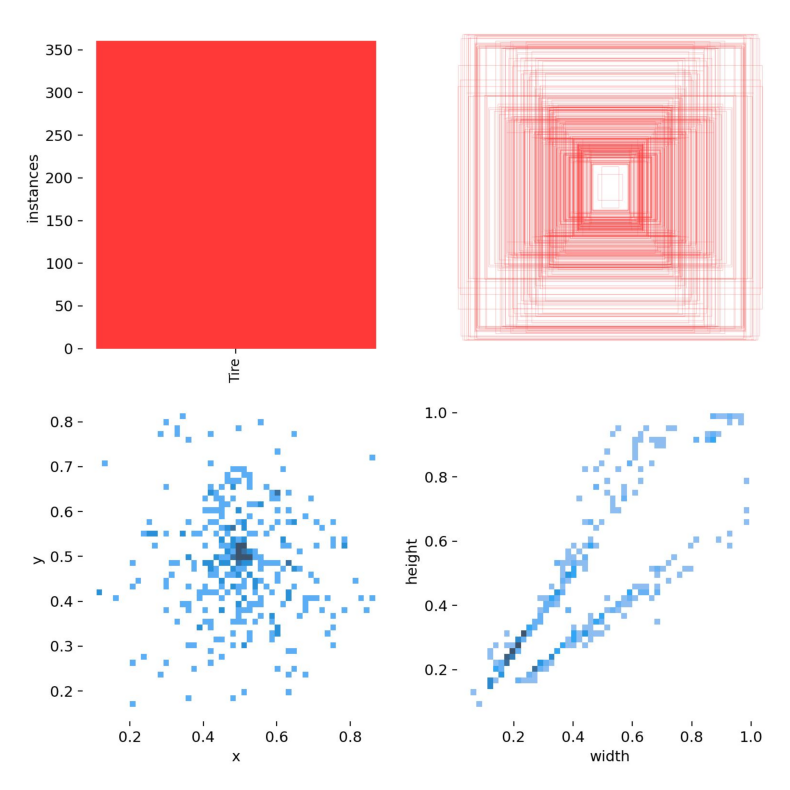

In [ ]:
#Plotting Labels

labels = cv.imread('/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/labels.jpg')
plt.figure(figsize=(10, 10))
labels_rgb = cv.cvtColor(labels, cv.COLOR_BGR2RGB)
plt.imshow(labels_rgb)
plt.axis('off')

**Interpretting the Labels**

Instances: A bar chart showing the count of detected "Tire" instances.

**Top Right (Stacked Bounding Boxes):**

This plot visualizes the bounding boxes stacked on top of each other in a red outline.It shows how the bounding boxes are distributed across the image space.
The center of the image has the densest concentration of boxes, indicating that most objects in your dataset tend to appear in the center of the images.
The gradual fading towards the edges indicates fewer objects towards the image boundaries.

**Bottom Left (x vs. y Scatter Plot):**

This scatter plot visualizes the distribution of bounding box center coordinates (x, y).
The x and y values are normalized to between 0 to 1, representing the position of the bounding boxes in the image.
The dense cluster near the center (around 0.5, 0.5) shows that most bounding boxes are centered near the middle of the image, with fewer boxes scattered toward the edges.


**Bottom Right (width vs. height Scatter Plot):**

This plot shows the relationship between the width and height of the bounding boxes.
The pattern indicates a correlation between width and height, as there are distinct diagonal lines. This suggests that objects in your dataset tend to maintain a consistent aspect ratio.
The diagonal clustering indicates that as the width of an object increases, its height tends to increase proportionally.


(np.float64(-0.5), np.float64(1999.5), np.float64(1999.5), np.float64(-0.5))

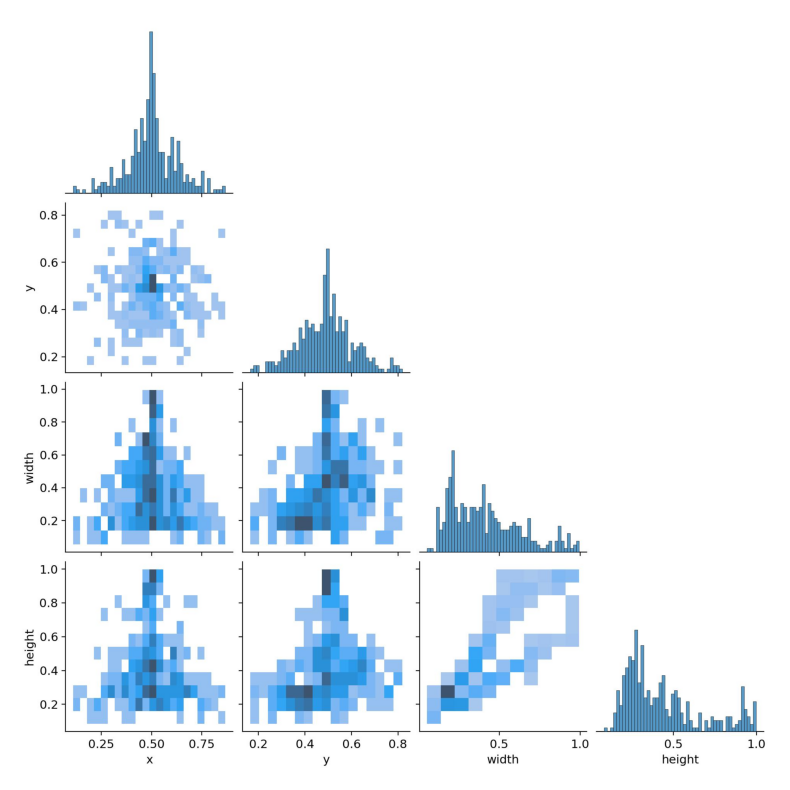

In [ ]:
#Labels Correlogram

Correlogram = cv.imread('/content/Auto-Tyre-Vision/yolov5/runs/train/train_results/labels_correlogram.jpg')
plt.figure(figsize=(10, 10))
Correlogram_rgb = cv.cvtColor(Correlogram, cv.COLOR_BGR2RGB)
plt.imshow(Correlogram_rgb)
plt.axis('off')

**A correlogram is a visual representation of the correlation between variables in a dataset. It is used to analyze the relationships between different bounding box attributes (x, y, width, height).
This correlogram is a type of pairplot, where different combinations of variables are plotted against each other, allowing you to visually inspect the relationships.**

![image.png](attachment:a0491b5c-aa80-4ce1-8b20-d0dfa1f27010.png)

Lets dive deeper into it

**Diagonals (Histograms):**
These represent the distribution of individual variables, i.e., the x, y, width, and height of the bounding boxes.
For example, the histogram in the x row shows how the x coordinates are distributed, while the histogram in the height row shows the distribution of the height of the bounding boxes.

**Off-diagonal plots (Hexbin plots):**
These are pairwise comparisons between different variables.
Each scatterplot shows how two variables are related. The hexagonal cells are color-coded to represent density: darker colors mean more points (more bounding boxes) fall in that region.
For example, the plot between x and y shows how the center coordinates of the bounding boxes are distributed in relation to each other.

**Explanation of each pairwise relationship:**

- x vs. y: Shows the scatter of the center positions of the bounding boxes on the image (x and y are normalized coordinates). A more concentrated or symmetrical scatter may imply a certain focus in the objects' locations.
- x vs. width: Examines how the x-position of the bounding box is related to the box width. Any visible trend here could reveal a pattern in the object positioning relative to their size.
- x vs. height: Similar to the above but for height, checking whether the x-coordinate has any relation with the height of bounding boxes.
- y vs. width and y vs. height: These explore whether the y-position of the bounding box correlates with its width or height.
- width vs. height: This scatterplot looks at the correlation between bounding box width and height. A positive correlation (points going in a diagonal) suggests that wider objects tend to be taller as well, and vice versa.